<a href="https://colab.research.google.com/github/AsraniSanjana/All_Codes/blob/main/All_Semester_Codes/SMA_sem8/Practical/SMA_Pract.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Twitter Sentiment

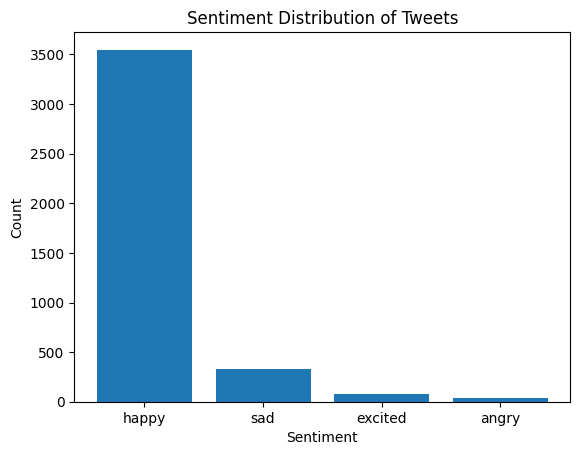

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming the dataset is named 'tweets.csv'
data = pd.read_csv("tweets.csv")

# Sample sentiment categories and keywords
sentiment_categories = {
    'happy': ['happy', 'fantastic', 'delighted', 'satisfied', 'good', 'best', 'delicious', 'tasty', 'refreshing'],
    'angry': ['angry', 'frustrated', 'disappointed', 'cheap', 'not recommended', 'waste of money', 'waste'],
    'excited': ['excited', 'thrilled', 'enthusiastic', 'love'],
    'sad': ['sad', 'unhappy', 'displeased', 'worst', 'very bitter', 'bad']
}

# List to store sentiment of each tweet
tweet_sentiments = []

for tweet in data['Tweet']:
    sentiment_scores = {'happy': 0, 'angry': 0, 'excited': 0, 'sad': 0}

    for category, keywords in sentiment_categories.items():
        for keyword in keywords:
            if keyword in str(tweet).lower():  # Convert to lowercase for case insensitivity
                sentiment_scores[category] += 1
                break

    tweet_sentiments.append(max(sentiment_scores, key=sentiment_scores.get))

data['sentiment'] = tweet_sentiments

sentiment_counts = data['sentiment'].value_counts()

plt.bar(sentiment_counts.index, sentiment_counts.values)
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Sentiment Distribution of Tweets')
plt.show()


# negative tweet analysis

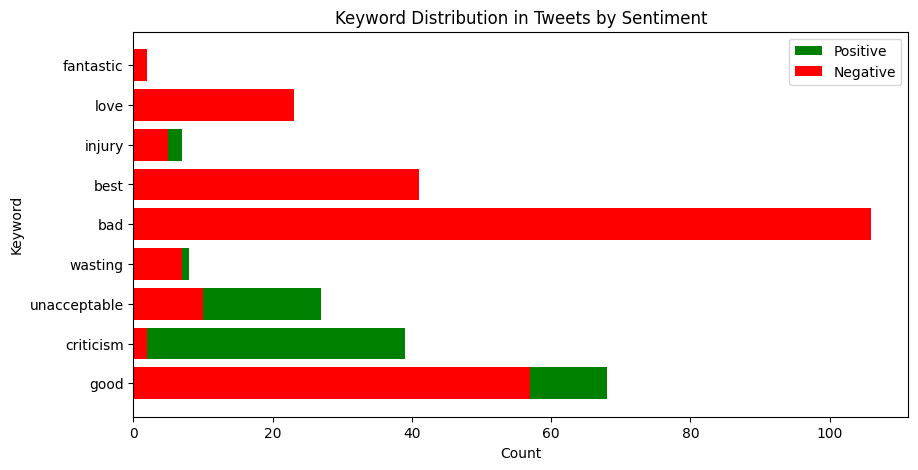

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Assuming the dataset is named 'tweets.csv'
data = pd.read_csv("tweets.csv")

# Sample sentiment categories
positive_keywords = ['good', 'love', 'fantastic', 'best', 'refreshing', 'flamboyantly']
negative_keywords = ['bad', 'criticism', 'unacceptable', 'wasting', 'injury', 'experiment']

# Combine all keywords
all_keywords = positive_keywords + negative_keywords

# List to store positive and negative keyword counts
positive_counts = Counter()
negative_counts = Counter()

# Iterate through tweets and count positive and negative keywords
for tweet, sentiment in zip(data['Tweet'], data['Sentiment']):
    for keyword in all_keywords:
        if keyword in str(tweet).lower():
            if sentiment == 'Negative':
                negative_counts[keyword] += 1
            elif sentiment == 'Positive':
                positive_counts[keyword] += 1

# Plotting
plt.figure(figsize=(10, 5))

plt.barh(range(len(positive_counts)), list(positive_counts.values()), align='center', color='green', label='Positive')
plt.yticks(range(len(positive_counts)), list(positive_counts.keys()))

plt.barh(range(len(negative_counts)), list(negative_counts.values()), align='center', color='red', label='Negative')
plt.yticks(range(len(negative_counts)), list(negative_counts.keys()))

plt.xlabel('Count')
plt.ylabel('Keyword')
plt.title('Keyword Distribution in Tweets by Sentiment')
plt.legend()
plt.show()


# hashtag popularity analyis

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 78069 (\N{EGYPTIAN HIEROGLYPH E030}) missing from current font.



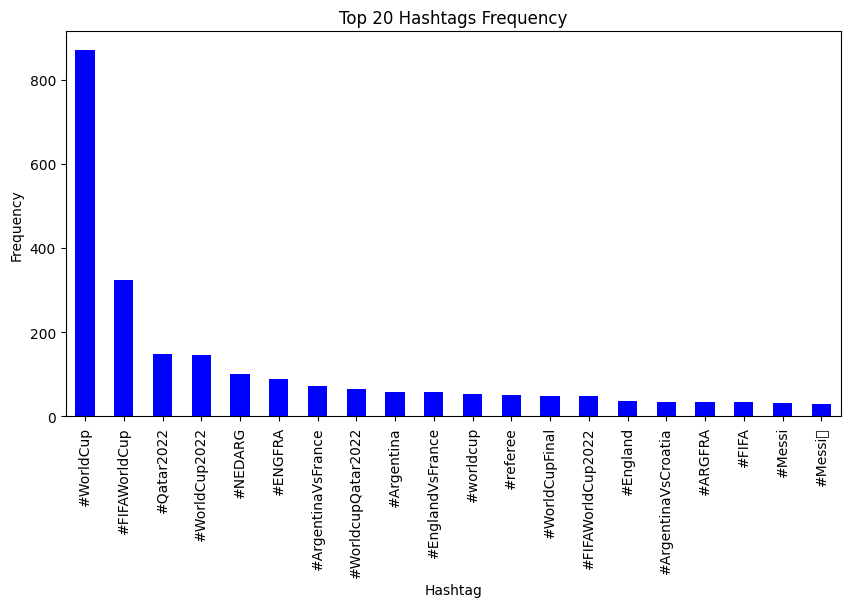

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import re

# Assuming the dataset is named 'tweets.csv'
data = pd.read_csv("tweets.csv")

# Regular expression pattern to find hashtags
pattern = r"#\w+"

# List to store all hashtags
hashtags = []

# Extract hashtags from each tweet and store them in the list
for tweet in data['Tweet']:
    hashtags.extend(re.findall(pattern, tweet))

# Count the occurrences of each hashtag
hashtag_counts = pd.Series(hashtags).value_counts()

# Plotting
plt.figure(figsize=(10, 5))

hashtag_counts[:20].plot(kind='bar', color='blue')  # Plotting only top 20 hashtags for better visualization
plt.xlabel('Hashtag')
plt.ylabel('Frequency')
plt.title('Top 20 Hashtags Frequency')
plt.show()


# trend

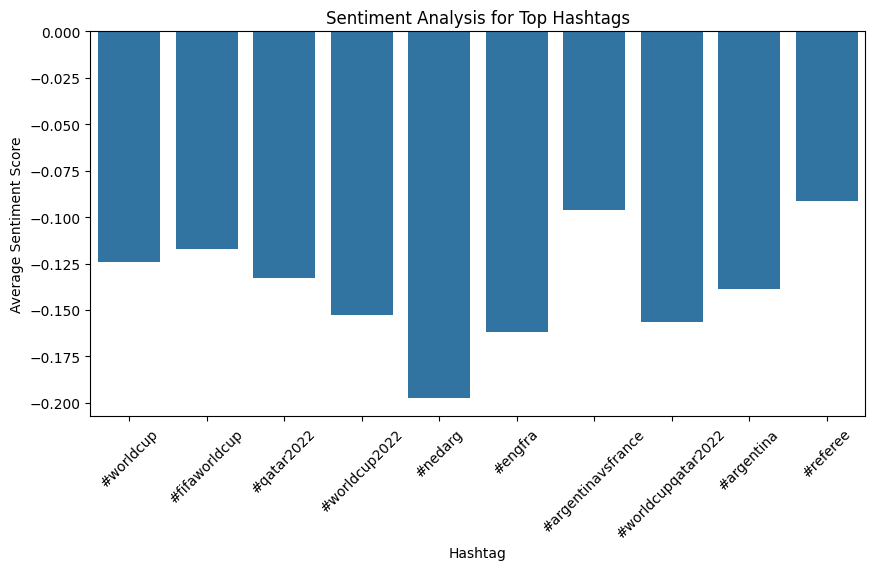

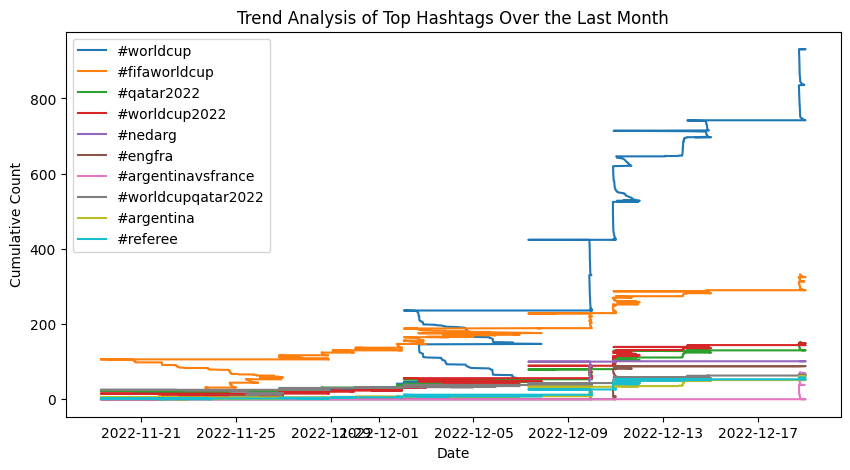

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
import re

# Load dataset
data = pd.read_csv("tweets.csv")

# Extract hashtags from tweets
pattern = r"#\w+"
data['Hashtags'] = data['Tweet'].apply(lambda x: re.findall(pattern, x.lower()))

# Count occurrences of each hashtag
hashtags_count = {}
for hashtags in data['Hashtags']:
    for hashtag in hashtags:
        if hashtag in hashtags_count:
            hashtags_count[hashtag] += 1
        else:
            hashtags_count[hashtag] = 1

# Sort hashtags by frequency
sorted_hashtags = sorted(hashtags_count.items(), key=lambda x: x[1], reverse=True)

# Top 10 popular hashtags
top_hashtags = dict(sorted_hashtags[:10])

# Sentiment analysis for each hashtag
sentiment_scores = {}
for hashtag in top_hashtags.keys():
    tweets_with_hashtag = data[data['Hashtags'].apply(lambda x: hashtag in x)]
    sentiment_scores[hashtag] = tweets_with_hashtag['Sentiment'].apply(lambda x: TextBlob(x).sentiment.polarity).mean()

# Plot sentiment for top hashtags
plt.figure(figsize=(10, 5))
sns.barplot(x=list(sentiment_scores.keys()), y=list(sentiment_scores.values()))
plt.xlabel('Hashtag')
plt.ylabel('Average Sentiment Score')
plt.title('Sentiment Analysis for Top Hashtags')
plt.xticks(rotation=45)
plt.show()

# Trend analysis over time (e.g., last month)
data['Date Created'] = pd.to_datetime(data['Date Created'])
start_date = data['Date Created'].max() - pd.DateOffset(months=1)
trend_data = data[data['Date Created'] >= start_date]

# Count tweets per day for each hashtag
daily_counts = {}
for hashtag in top_hashtags.keys():
    daily_counts[hashtag] = trend_data['Hashtags'].apply(lambda x: hashtag in x).sum()

# Plot trend over time
plt.figure(figsize=(10, 5))
for hashtag, count in daily_counts.items():
    plt.plot(trend_data['Date Created'], trend_data['Hashtags'].apply(lambda x: hashtag in x).cumsum(), label=hashtag)

plt.xlabel('Date')
plt.ylabel('Cumulative Count')
plt.title('Trend Analysis of Top Hashtags Over the Last Month')
plt.legend()
plt.show()


#Intent



In [ ]:
!pip install faker
import csv
import random
from faker import Faker
from datetime import datetime, timedelta

# Initialize Faker to generate fake data
fake = Faker()

# Possible values for cust_location, cust_religion, cust_gender
locations = ['New York', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix', 'Philadelphia']
religions = ['Christianity', 'Islam', 'Hinduism', 'Buddhism', 'Judaism', 'Sikhism']
genders = ['Male', 'Female', 'Other']

# Possible values for delivery_status
delivery_statuses = ['out_for_delivery', 'reached', 'will arrive this week', 'on hold']

# Possible values for order_statuses including 'refund-requested'
order_statuses = ['cancelled', 'updated', 'successful', 'refund-requested']

# Possible cancel reasons
cancel_reasons = ['Didn\'t like the product', 'Changed my mind', 'Found better deal elsewhere', 'Product was damaged']

# Possible refund reasons
refund_reasons = ['Product didn\'t meet expectations', 'Received wrong item', 'Item was defective']

# Function to generate random feedback
def generate_random_feedback():
    feedbacks = [
        "Can speed up the process.",
        "Would love it if delivery was faster.",
        "Good customer service.",
        "The food quality was excellent.",
        "Needs improvement in packaging.",
        "Overall satisfied with the experience.",
        "Would rather chose Amazon.",
        "Degrading Service",
        "Below Expectations. Worse than ever.",
        "Flipkart foes it better ngl",
        "Copying dmart???",
        "No one can beat amazon",
        "thrift copy of amazon lol "
    ]
    return random.choice(feedbacks)

# Function to generate random shipping address
def generate_random_address():
    return fake.address()

# Function to generate random order date
def generate_order_date():
    return fake.date_time_between(start_date='-30d', end_date='now').strftime('%Y-%m-%d')

# Function to generate random delivery date
def generate_delivery_date(order_date, delivery_option):
    if delivery_option == 'Delivery':
        order_date = datetime.strptime(order_date, '%Y-%m-%d')
        max_delivery_days = random.randint(2, 10)  # Delivery within 2 to 10 days
        delivery_date = order_date + timedelta(days=max_delivery_days)
        return delivery_date.strftime('%Y-%m-%d')
    else:
        return ''

# Define a list of items
items_list = ['item1', 'item2', 'item3', 'item4', 'item5', 'item6', 'item7', 'item8', 'item9', 'item10']

# Function to generate random row
def generate_random_row():
    delivery_option = random.choice(['Delivery', 'Takeaway'])
    order_date = generate_order_date()
    delivery_date = generate_delivery_date(order_date, delivery_option)
    current_date = datetime.now().strftime('%Y-%m-%d')

    if delivery_option == 'Delivery':
        if current_date >= delivery_date and delivery_date != '':
            delivery_status = 'reached'
        else:
            delivery_status = random.choice(delivery_statuses)
    else:
        delivery_status = ''

    order_status = random.choice(order_statuses)
    cancel_reason = random.choice(cancel_reasons) if order_status == 'cancelled' else ''
    refund_reason = random.choice(refund_reasons) if order_status == 'refund-requested' else ''

    reason = cancel_reason if order_status == 'cancelled' else refund_reason

    # Generate a random number of items for the order
    num_items = random.randint(1, min(3, len(items_list)))  # At most 3 items, depending on the length of items_list
    ordered_items = random.sample(items_list, num_items)

    row = {
        'cust_location': random.choice(locations),
        'cust_religion': random.choice(religions),
        'cust_age': random.randint(18, 80),
        'cust_gender': random.choice(genders),
        'cust_bill': round(random.uniform(10.0, 100.0), 2),
        'feedback': generate_random_feedback(),
        'mode-of-payment': random.choice(['Cash', 'Credit Card', 'Debit Card', 'Online Payment']),
        'Delivery-Takeaway': delivery_option,
        'shipping-address': generate_random_address() if delivery_option == 'Delivery' else '',
        'delivery_status': delivery_status,
        'order_status': order_status,
        'ordered_items': ', '.join(ordered_items),
        'order_date': order_date,
        'delivery_date': delivery_date,
        'payment_status': random.choice(['Paid', 'Pending', 'Failed']),
        'cancel_reason': cancel_reason,
        'refund_reason': refund_reason
    }
    return row

# Function to generate random CSV file
def generate_random_csv(num_records):
    with open('order.csv', 'w', newline='') as csvfile:
        fieldnames = ['cust_location', 'cust_religion', 'cust_age', 'cust_gender', 'cust_bill', 'feedback', 'mode-of-payment', 'Delivery-Takeaway', 'shipping-address', 'delivery_status', 'order_status', 'ordered_items', 'order_date', 'delivery_date', 'payment_status', 'cancel_reason', 'refund_reason']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

        writer.writeheader()
        for _ in range(num_records):
            writer.writerow(generate_random_row())

# Input the number of records
num_records = int(input("Enter the number of records: "))
generate_random_csv(num_records)
print(f"CSV file with {num_records} records generated successfully!")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 10.1 MB/s eta 0:00:00
Enter the number of records: 30
CSV file with 30 records generated successfully!


market basket analysis- arm:

   Item Combination  Count
14   (item1, item6)      3
0   (item5, item10)      2
16  (item10, item3)      2
26   (item4, item9)      2
20   (item7, item3)      2


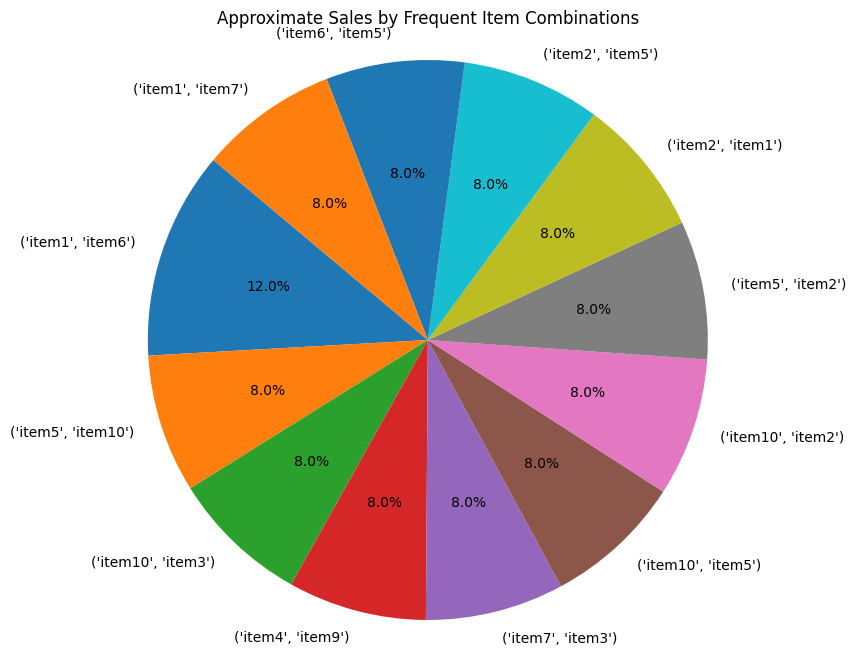

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv('order.csv')

# Initialize combo_counts dictionary to store counts of item combinations
combo_counts = {}

# Iterate over each row in the DataFrame
for _, row in df.iterrows():
    items = row['ordered_items'].split(', ')  # Split the ordered_items string into a list of items
    # Generate all possible combinations of items and update the combo_counts dictionary
    for i in range(len(items)):
        for j in range(i+1, len(items)):
            combo = (items[i], items[j])
            combo_counts[combo] = combo_counts.get(combo, 0) + 1

# Convert combo_counts dictionary to a DataFrame
combo_counts_df = pd.DataFrame(list(combo_counts.items()), columns=['Item Combination', 'Count'])

# Sort the DataFrame by count in descending order
combo_counts_df = combo_counts_df.sort_values(by='Count', ascending=False)

print(combo_counts_df.head())  # Display the top combinations and their counts

# Calculate total sales
total_sales = combo_counts_df['Count'].sum()

# Filter out combinations with fewer sales for clarity
threshold = 2  # Adjust as needed
frequent_combos = combo_counts_df[combo_counts_df['Count'] >= threshold]

# If there are no frequent combinations, exit
if frequent_combos.empty:
    print("No frequent combinations found.")
    exit()

# Calculate total sales for frequent combos
frequent_combo_sales = frequent_combos['Count'].sum()

# Plot a pie chart
plt.figure(figsize=(10, 8))
plt.pie(frequent_combos['Count'], labels=frequent_combos['Item Combination'], autopct='%1.1f%%', startangle=140)
plt.title('Approximate Sales by Frequent Item Combinations')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


utterancE:

In [ ]:
import csv
import re

# Load the dataset
def load_dataset(file_path):
    dataset = []
    with open(file_path, 'r', newline='') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader:
            dataset.append(row['feedback'])
    return dataset

# Define intent keywords
intent_keywords = {
    'positive_review': {'good', 'lovely', 'nice', 'awesome', 'fantastic', 'delighted', 'satisfied', 'best', 'delicious', 'tasty', 'refreshing'},
    'negative_review': {'bad', 'worst', 'angry', 'frustrated', 'disappointed', 'cheap', 'not recommended', 'waste', 'can do better'},
    'neutral_review': {'okay', 'average', 'alright', 'fine'},
    'delivery_status': {'delivery', 'arrive', 'take', 'long'}
}

# Function to identify intent
def identify_intent(text):
    text = text.lower()
    for intent, keywords in intent_keywords.items():
        if any(word in text for word in keywords):
            return intent
    return 'unknown'


In [ ]:
dataset = load_dataset('order.csv')
input_text = str(input("utterance:"))
intent = identify_intent(input_text)
print("Intent:", intent)


utterance:when will my order come?????
Intent: unknown


# PBI

We'll generate the following visualizations:

Number of Positive vs Negative Reviews

Sales During Winter vs Summer
Positive Feedbacks if Delivery Done Within One Week
Frequent Reasons of Cancellation and Refund
Most Orders from Country/State

In [ ]:

!pip install pygwalker

import pandas as pd
import pygwalker as pyg

df=pd.read_csv('order.csv')


dir(pyg)
pyg.walk(df,dark="dark")



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.8/17.8 MB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 991.5/991.5 kB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 29.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 51.6 MB/s eta 0:00:00
  Attempting uninstall: duckdb
    Found existing installation: duckdb 0.9.2
    Uninstalling duckdb-0.9.2:
      Successfully uninstalled duckdb-0.9.2


Box(children=(HTML(value='<div id="ifr-pyg-00061586e2a1f0cbVZOGBmzKQNuDiHgE" style="height: auto">\n    <head>…

# Competitor


https://pro.similarweb.com/#/digitalsuite/websiteanalysis/traffic-engagement/*/999/3m/?webSource=Total&selectedWidgetTab=UniqueUsers&key=amazon.com,flipkart.com,ebay.com,walmart.com,target.com


https://www.kaggle.com/code/kendrake6/google-playstore-vs-apple-app-store-eda/input

https://pro.similarweb.com/#/digitalsuite/websiteanalysis/traffic-engagement/*/999/3m/?webSource=Total&selectedWidgetTab=UniqueUsers&key=apple.com,google.com

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")

# Visualization libraries
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Reading data files and Making Dataframes
# Assuming "googlepathstore.csv" and "AppleStore.csv" are the correct file names

# For Google DataFrame
dfGoogle = pd.read_csv("googleplaystore.csv")  # Adjust the file path as needed

# For Apple DataFrame
dfApple = pd.read_csv("AppleStore.csv")  # Adjust the file path as needed

dfGoogle.head()
dfApple.head()

,Unnamed: 0,id,track_name,size_bytes,currency,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
0,1,281656475,PAC-MAN Premium,100788224,USD,3.99,21292,26,4.0,4.5,6.3.5,4+,Games,38,5,10,1
1,2,281796108,Evernote - stay organized,158578688,USD,0.00,161065,26,4.0,3.5,8.2.2,4+,Productivity,37,5,23,1
2,3,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",100524032,USD,0.00,188583,2822,3.5,4.5,5.0.0,4+,Weather,37,5,3,1
3,4,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",128512000,USD,0.00,262241,649,4.0,4.5,5.10.0,12+,Shopping,37,5,9,1
4,5,282935706,Bible,92774400,USD,0.00,985920,5320,4.5,5.0,7.5.1,4+,Reference,37,5,45,1


These two datasets are vastly different with some similarities. In my cleaning process, I will try to make sure both dataframes have similar columns. For the cleaning process, I'll only keep columns that are common in both dataframes. My goal is to have these columns for both dataframes:

App
Category
Rating
Rating Class
Reviews
Price
Content Rating

In [ ]:
# Dropping Columns
dfGoogle = dfGoogle.drop(columns = ["Current Ver", "Android Ver", 'Last Updated',"Size", "Genres", "Installs"])
dfApple = dfApple.drop(columns = ["size_bytes","currency", "id", "vpp_lic", "ver", "Unnamed: 0","lang.num", "user_rating_ver","rating_count_ver", "sup_devices.num","ipadSc_urls.num"])

#Renaming Columns
dfApple = dfApple.rename(columns = {"rating_count_tot": "Reviews", "user_rating" : "Rating", "cont_rating" : "Content Rating",
                          "prime_genre" : "Category", "price" : "Price", "size_bytes" : "Size", "track_name" : "App"})

#One Hot Encoding Type
dfApple.loc[(dfApple['Price'] >= 0), 'Type'] = "1"
dfApple.loc[(dfApple['Price'] == 0), 'Type'] = "0"
dfGoogle.loc[(dfGoogle['Type'] == "Free"), 'Type'] = "0"
dfGoogle.loc[(dfGoogle['Type'] == "Paid"), 'Type'] = "1"
#  we need to make sure that their data types are also same in our cleaning process. This will allow us to have meaningful comparison. We can't compare string values to integer values!!
# Cleaning Functions
# For APPLE
def cleanContent(x):                                 #Unifying Content Rating Column for Apple
    if x == "4+":
        return "Everyone"
    elif x == "9+":
        return "Everyone 10+"
    elif x == "12+":
        return 'Teen'
    elif x == "17+":
        return 'Mature 17+'

def cleanCategoryApp(x):                             #Reference and Book apps fall into the same category.
    if x == "Reference" or x == "Book":
        return "Books & Reference"
    elif x == "Music":
        return "Utilities"
    else:
        return x

#For GOOGLE
def cleanCategory(x):                                # Recategorizing Google Apps
    if x == "BOOKS_AND_REFERENCE":
        return "Books & Reference"
    elif x == "BUSINESS":
        return "Business"
    elif x in ["ENTERTAINMENT", "Comics", "EVENTS"]:
        return "Entertainment"
    elif x =="FOOD_AND_DRINK":
        return "Food & Drink"
    elif x in ["EDUCATION", "PARENTING"]:
        return "Education"
    elif x in ["SOCIAL", "COMMUNICATION"]:
        return "Social Networking"
    elif x == "PRODUCTIVITY":
        return "Productivity"
    elif x == "WEATHER":
        return "Weather"
    elif x == "MAPS_AND_NAVIGATION":
        return "Navigation"
    elif x == "GAME":
        return "Games"
    elif x in ["HEALTH_AND_FITNESS", "BEAUTY"]:
        return 'Health & Fitness'
    elif x in ['LIFESTYLE',"DATING","FAMILY","AUTO_AND_VEHICLES","HOUSE_AND_HOME"]:
        return "Lifestyle"
    elif x == "MEDICAL":
        return "Medical"
    elif x == "SHOPPING":
        return "Shopping"
    elif x == "PHOTOGRAPHY" or x == "VIDEO_PLAYERS":
        return "Photo & Video"
    elif x == "NEWS_AND_MAGAZINES":
        return "News"
    elif x == "FINANCE":
        return "Finance"
    elif x == "TRAVEL_AND_LOCAL":
        return "Travel"
    elif x == "SPORTS":
        return "Sports"
    elif x in ["TOOLS", "ART_AND_DESIGN",'PERSONALIZATION', 'LIBRARIES_AND_DEMO']:
        return "Utilities"
    else:
        pass



def cleanPrice(x):                                 #Cleaning prices for Google playstore
    if x == "0":
        return "0"
    elif '$' in x:
        x = x[1:]
    elif x == "Everyone":
        return "0"
    return x


def cleanReviews(x):                              #Cleaning review column for Google Playstore
    if "M" in x:
        x = x.replace(".0M", "000000")
        return x
    else:
        return x



# Applying Cleaning Functions to Google Dataframe
dfGoogle["Price"] = dfGoogle["Price"].replace([x for x in dfGoogle["Price"]], [cleanPrice(x) for x in dfGoogle["Price"]])
dfGoogle["Price"] = dfGoogle["Price"].astype(float)
dfGoogle["Category"] = dfGoogle["Category"].replace([x for x in dfGoogle["Category"]], [cleanCategory(x) for x in dfGoogle["Category"]])
dfGoogle["Reviews"] = dfGoogle["Reviews"].replace([x for x in dfGoogle["Reviews"]], [cleanReviews(x) for x in dfGoogle["Reviews"]])
dfGoogle["Reviews"] = dfGoogle["Reviews"].astype(int)

#Applying Cleaning Functions to Apple Dataframe
dfApple["Content Rating"] = dfApple["Content Rating"].replace([x for x in dfApple["Content Rating"]], [cleanContent(x) for x in dfApple["Content Rating"]])
dfApple["Category"] = dfApple["Category"].replace([x for x in dfApple["Category"]], [cleanCategoryApp(x) for x in dfApple["Category"]])

# Adding Rating Class Column
dfGoogle.loc[(dfGoogle['Rating'] >= 0) & (dfGoogle['Rating'] < 1), 'Rating Class'] = "0-0.99"
dfGoogle.loc[(dfGoogle['Rating'] >= 1) & (dfGoogle['Rating'] < 2), 'Rating Class'] = "1-1.99"
dfGoogle.loc[(dfGoogle['Rating'] >= 2) & (dfGoogle['Rating'] < 3), 'Rating Class'] = "2-2.99"
dfGoogle.loc[(dfGoogle['Rating'] >= 3) & (dfGoogle['Rating'] < 4), 'Rating Class'] = "3-3.99"
dfGoogle.loc[(dfGoogle['Rating'] >= 4) & (dfGoogle['Rating'] < 5), 'Rating Class'] = "4-4.99"
dfGoogle.loc[dfGoogle['Rating'] == 5, 'Rating Class'] = "5"

# Adding Rating Class Column
dfApple.loc[(dfApple['Rating'] >= 0) & (dfApple['Rating'] < 1), 'Rating Class'] = "0-0.99"
dfApple.loc[(dfApple['Rating'] >= 1) & (dfApple['Rating'] < 2), 'Rating Class'] = "1-1.99"
dfApple.loc[(dfApple['Rating'] >= 2) & (dfApple['Rating'] < 3), 'Rating Class'] = "2-2.99"
dfApple.loc[(dfApple['Rating'] >= 3) & (dfApple['Rating'] < 4), 'Rating Class'] = "3-3.99"
dfApple.loc[(dfApple['Rating'] >= 4) & (dfApple['Rating'] < 5), 'Rating Class'] = "4-4.99"
dfApple.loc[dfApple['Rating'] == 5, 'Rating Class'] = "5"


dfGoogle.dropna(inplace =True) #we don't like null values.
dfApple.dropna(inplace =True) #we don't like null values.






comparison now

In [ ]:
# Calculate the number of free and paid apps for Google Play Store
google_free_apps = dfGoogle[dfGoogle['Type'] == 0].shape[0]
google_paid_apps = dfGoogle[dfGoogle['Type'] == 1].shape[0]

# Calculate the number of free and paid apps for Apple App Store
apple_free_apps = dfApple[dfApple['Type'] == '0'].shape[0]
apple_paid_apps = dfApple[dfApple['Type'] == '1'].shape[0]

# Create a figure with subplots for Google and Apple
fig = make_subplots(1, 2, specs=[[{'type':'domain'}, {'type':'domain'}]], subplot_titles=('Google Play Store', 'Apple App Store'))

# Add data to the subplots
fig.add_trace(go.Pie(labels=['Free', 'Paid'], values=[google_free_apps, google_paid_apps], name="Google Play Store"),
              1, 1)
fig.add_trace(go.Pie(labels=['Free', 'Paid'], values=[apple_free_apps, apple_paid_apps], name="Apple App Store"),
              1, 2)

# Update layout
fig.update_layout(title_text='Percentage of Free vs. Paid Apps', showlegend=False)

# Show the plot
fig.show()


In [ ]:
# Calculate the number of free and paid apps for Google Play Store
google_free_apps = dfGoogle[dfGoogle['Type'] == '0'].shape[0]
google_paid_apps = dfGoogle[dfGoogle['Type'] == '1'].shape[0]

# Create labels and values for the pie chart
label_google = ['Free', 'Paid']
val_google = [google_free_apps, google_paid_apps]

# Adding the Pie chart for Google Play Store
fig.add_trace(go.Pie(labels=label_google, values=val_google, textinfo='label+percent', insidetextorientation='radial', name="Google Paid vs Free"),
              row=1, col=1)


In [ ]:
# Calculate the percentage of apps in each category for Google Play Store
google_category_percentage = dfGoogle['Category'].value_counts(normalize=True) * 100

# Calculate the percentage of apps in each category for Apple App Store
apple_category_percentage = dfApple['Category'].value_counts(normalize=True) * 100

# Sort the categories based on percentage for better visualization
google_category_percentage = google_category_percentage.sort_values(ascending=False)
apple_category_percentage = apple_category_percentage.sort_values(ascending=False)

# Create a figure with subplots for Google and Apple
fig = make_subplots(1, 2, subplot_titles=('Google Play Store', 'Apple App Store'))

# Add data to the subplots
fig.add_trace(go.Bar(x=google_category_percentage.index, y=google_category_percentage.values, name="Google Play Store"),
              row=1, col=1)
fig.add_trace(go.Bar(x=apple_category_percentage.index, y=apple_category_percentage.values, name="Apple App Store"),
              row=1, col=2)

# Update layout
fig.update_layout(title_text='Percentage of Apps According to Categories', showlegend=False)
fig.update_xaxes(title_text="Category", row=1, col=1)
fig.update_xaxes(title_text="Category", row=1, col=2)
fig.update_yaxes(title_text="% of Apps", row=1, col=1)
fig.update_yaxes(title_text="% of Apps", row=1, col=2)

# Show the plot
fig.show()


In [ ]:
# Calculate the percentage of apps in each category and age group for Google Play Store
google_age_category_percentage = dfGoogle.groupby(['Category', 'Content Rating']).size().unstack(fill_value=0).apply(lambda x: x / x.sum() * 100, axis=1)

# Calculate the percentage of apps in each category and age group for Apple App Store
apple_age_category_percentage = dfApple.groupby(['Category', 'Content Rating']).size().unstack(fill_value=0).apply(lambda x: x / x.sum() * 100, axis=1)

# Create a figure with subplots for Google and Apple
fig = make_subplots(rows=1, cols=2, subplot_titles=('Google Play Store', 'Apple App Store'))

# Add data to the subplots for Google Play Store
for age_group in google_age_category_percentage.columns:
    fig.add_trace(go.Bar(x=google_age_category_percentage.index, y=google_age_category_percentage[age_group], name=age_group),
                  row=1, col=1)

# Add data to the subplots for Apple App Store
for age_group in apple_age_category_percentage.columns:
    fig.add_trace(go.Bar(x=apple_age_category_percentage.index, y=apple_age_category_percentage[age_group], name=age_group),
                  row=1, col=2)

# Update layout
fig.update_layout(title_text='Percentage of Apps According to Categories and Age Groups',
                  showlegend=True,
                  barmode='stack',
                  legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
                  xaxis=dict(title='Category'),
                  yaxis=dict(title='% of Apps'))

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")

# Visualization libraries
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Sample DataFrames
# dfGoogle = pd.read_csv("googleplaystore.csv")  # Adjust the file path as needed
# dfApple = pd.read_csv("AppleStore.csv")  # Adjust the file path as needed

# For demonstration, let's assume dfGoogle and dfApple are already defined

# Calculate the percentage of apps in each category and age group for Google Play Store
google_age_category_percentage = dfGoogle.groupby(['Category', 'Content Rating']).size().unstack(fill_value=0).apply(lambda x: x / x.sum() * 100, axis=1)

# Calculate the percentage of apps in each category and age group for Apple App Store
apple_age_category_percentage = dfApple.groupby(['Category', 'Content Rating']).size().unstack(fill_value=0).apply(lambda x: x / x.sum() * 100, axis=1)

# Function to plot stacked bar graph
def plot_stacked_bar(data, title):
    fig = go.Figure()

    # Add data to the plot
    for age_group in data.columns:
        fig.add_trace(go.Bar(x=data.index, y=data[age_group], name=age_group))

    # Update layout
    fig.update_layout(title_text=title,
                      showlegend=True,
                      legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
                      xaxis=dict(title='Category'),
                      yaxis=dict(title='% of Apps'),
                      barmode='stack')

    # Show the plot
    fig.show()

# Function to plot histogram
def plot_histogram(data, title):
    # You can implement histogram plot if needed
    pass

# Function to plot pie chart
def plot_pie_chart(data, title):
    fig = go.Figure()

    # Add data to the plot
    fig.add_trace(go.Pie(labels=data.index, values=data.sum(axis=1)))

    # Update layout
    fig.update_layout(title_text=title)

    # Show the plot
    fig.show()

# Function to plot other types of visualizations
def plot_other_visualization(data, title):
    # You can implement other types of visualizations if needed
    pass

# Main program
def main():
    print("Welcome to the App Store Visualization Program!")
    print("Choose an option:")
    print("1. Stacked bar graph")
    print("2. Histogram")
    print("3. Pie chart")
    choice = input("Enter your choice (1, 2, or 3): ")

    if choice == '1':
        visualization_type = 'stacked_bar'
    elif choice == '2':
        visualization_type = 'histogram'
    elif choice == '3':
        visualization_type = 'pie_chart'
    else:
        print("Invalid choice. Exiting...")
        return

    # Plot for Google Play Store
    title_google = 'Percentage of Apps in Google Play Store According to Categories and Age Groups'
    if visualization_type == 'stacked_bar':
        plot_stacked_bar(google_age_category_percentage, title_google)
    elif visualization_type == 'histogram':
        plot_histogram(google_age_category_percentage, title_google)
    elif visualization_type == 'pie_chart':
        plot_pie_chart(google_age_category_percentage, title_google)

    # Plot for Apple App Store
    title_apple = 'Percentage of Apps in Apple App Store According to Categories and Age Groups'
    if visualization_type == 'stacked_bar':
        plot_stacked_bar(apple_age_category_percentage, title_apple)
    elif visualization_type == 'histogram':
        plot_histogram(apple_age_category_percentage, title_apple)
    elif visualization_type == 'pie_chart':
        plot_pie_chart(apple_age_category_percentage, title_apple)

if __name__ == "__main__":
    main()


Welcome to the App Store Visualization Program!
Choose an option:
1. Stacked bar graph
2. Histogram
3. Pie chart
Enter your choice (1, 2, or 3): 3


#social media engagement dataset

https://www.kaggle.com/code/vengadeshwaran58/eda-social-media-engagement-dataset

   Sno  X  State       conversation_id  retweet_count  reply_count  \
0    1  1  Assam  S1438213588544409600              0            1   
1    2  2  Assam  S1438437895270846464              0            1   
2    3  3  Assam  S1439558164936941574              0            1   
3    4  4  Assam  S1439920409801945089              0            1   
4    5  5  Assam  S1440221445011898371              0            1   

   like_count  quote_count  Buzz                    id  ...    i we.1 they  \
0           1            0     3  S1438213588544409600  ...  0.0  0.0  0.0   
1           1            0     3  S1438437895270846464  ...  0.0  0.0  0.0   
2           1            0     3  S1439558164936941574  ...  0.0  0.0  0.0   
3           3            0     5  S1439920409801945089  ...  0.0  0.0  0.0   
4           1            0     3  S1440221445011898371  ...  0.0  0.0  0.0   

  insight cause discrep certitude  Positive Negative Total_Sentiment  
0    3.23   0.0    0.00       0.0      

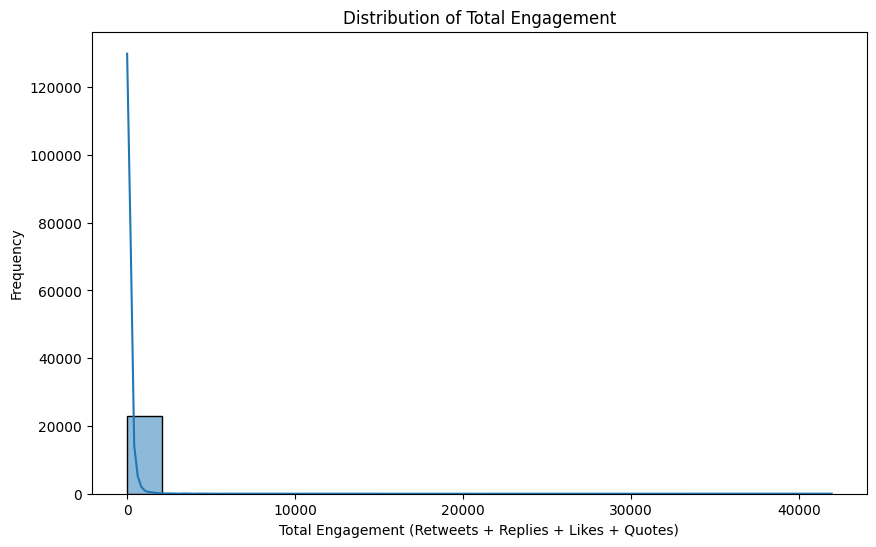

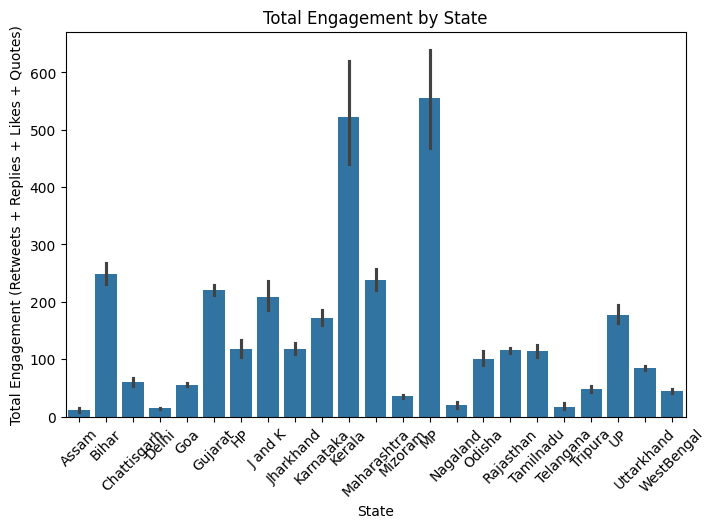

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
data = pd.read_csv('engagement.csv')

# Explore the data
print(data.head())
print(data.info())
print(data.describe())

# Analyze engagement metrics
data['total_engagement'] = data['retweet_count'] + data['reply_count'] + data['like_count'] + data['quote_count']
average_engagement_per_post = data['total_engagement'].mean()
total_engagement_overall = data['total_engagement'].sum()

# Visualize engagement
plt.figure(figsize=(10, 6))
sns.histplot(data['total_engagement'], bins=20, kde=True)
plt.title('Distribution of Total Engagement')
plt.xlabel('Total Engagement (Retweets + Replies + Likes + Quotes)')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(8, 5))
sns.barplot(x='State', y='total_engagement', data=data)
plt.title('Total Engagement by State')
plt.xlabel('State')
plt.ylabel('Total Engagement (Retweets + Replies + Likes + Quotes)')
plt.xticks(rotation=45)
plt.show()

# You can add more visualizations as per your requirement


   Sno  X  State       conversation_id  retweet_count  reply_count  \
0    1  1  Assam  S1438213588544409600              0            1   
1    2  2  Assam  S1438437895270846464              0            1   
2    3  3  Assam  S1439558164936941574              0            1   
3    4  4  Assam  S1439920409801945089              0            1   
4    5  5  Assam  S1440221445011898371              0            1   

   like_count  quote_count  Buzz                    id  ...    i we.1 they  \
0           1            0     3  S1438213588544409600  ...  0.0  0.0  0.0   
1           1            0     3  S1438437895270846464  ...  0.0  0.0  0.0   
2           1            0     3  S1439558164936941574  ...  0.0  0.0  0.0   
3           3            0     5  S1439920409801945089  ...  0.0  0.0  0.0   
4           1            0     3  S1440221445011898371  ...  0.0  0.0  0.0   

  insight cause discrep certitude  Positive Negative Total_Sentiment  
0    3.23   0.0    0.00       0.0      

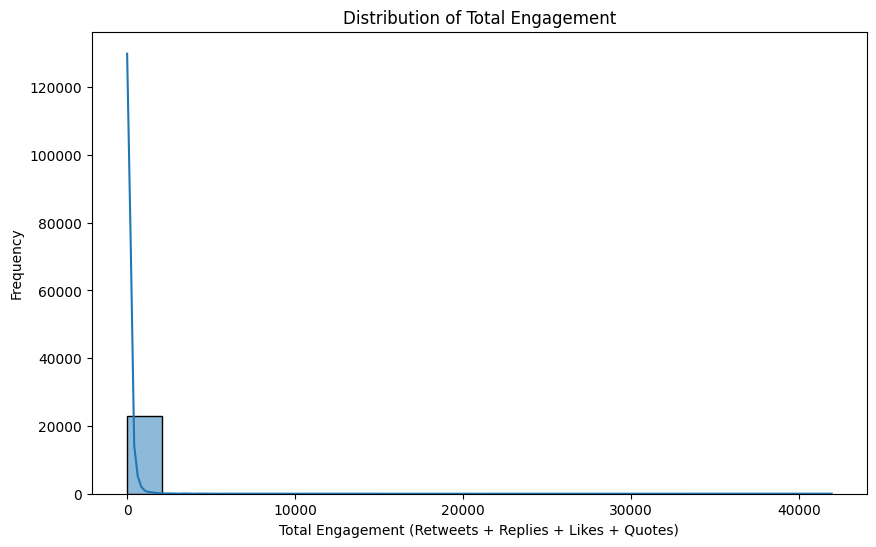

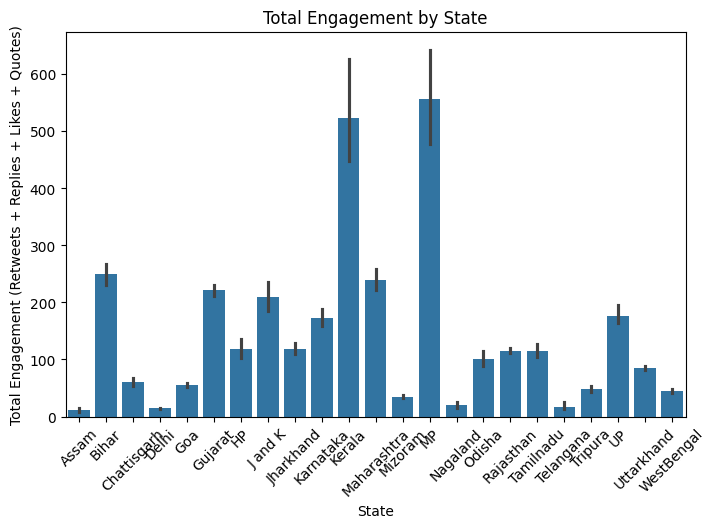

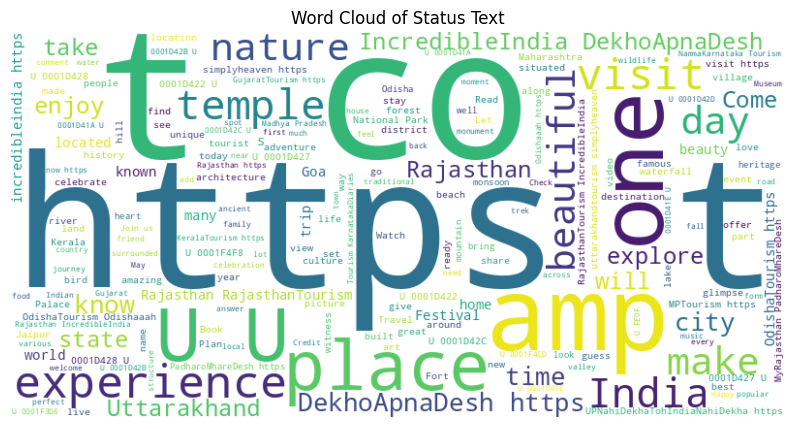

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Load the data
data = pd.read_csv('engagement.csv')

# Explore the data
print(data.head())
print(data.info())
print(data.describe())

# Analyze engagement metrics
data['total_engagement'] = data['retweet_count'] + data['reply_count'] + data['like_count'] + data['quote_count']
average_engagement_per_post = data['total_engagement'].mean()
total_engagement_overall = data['total_engagement'].sum()

# Visualize engagement
plt.figure(figsize=(10, 6))
sns.histplot(data['total_engagement'], bins=20, kde=True)
plt.title('Distribution of Total Engagement')
plt.xlabel('Total Engagement (Retweets + Replies + Likes + Quotes)')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(8, 5))
sns.barplot(x='State', y='total_engagement', data=data)
plt.title('Total Engagement by State')
plt.xlabel('State')
plt.ylabel('Total Engagement (Retweets + Replies + Likes + Quotes)')
plt.xticks(rotation=45)
plt.show()

# Generate a WordCloud
text = ' '.join(data['Status text'].dropna())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Status Text')
plt.axis('off')
plt.show()


#eda

https://www.kaggle.com/code/shahules/zomato-complete-eda-and-lstm-model/input?select=zomato.csv

In [ ]:
import pandas as pd

# Specify the file path of your CSV file
file_path = "zomato.csv"

# Try reading the first 100 rows of the CSV file
try:
    df = pd.read_csv(file_path, nrows=100)
except UnicodeDecodeError:
    try:
        df = pd.read_csv(file_path, nrows=100, encoding='latin1')
    except Exception as e:
        print("Error:", e)
        print("Unable to read the CSV file. Please check the file path and try again.")
        exit()

# Display the shape of the DataFrame
print("Dataset contains {} rows and {} columns".format(df.shape[0], df.shape[1]))

# Display the first few rows of the DataFrame
print(df.head())


Dataset contains 100 rows and 17 columns
                                                 url  \
0  https://www.zomato.com/bangalore/jalsa-banasha...   
1  https://www.zomato.com/bangalore/spice-elephan...   
2  https://www.zomato.com/SanchurroBangalore?cont...   
3  https://www.zomato.com/bangalore/addhuri-udupi...   
4  https://www.zomato.com/bangalore/grand-village...   

                                             address                   name  \
0  942, 21st Main Road, 2nd Stage, Banashankari, ...                  Jalsa   
1  2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...         Spice Elephant   
2  1112, Next to KIMS Medical College, 17th Cross...        San Churro Cafe   
3  1st Floor, Annakuteera, 3rd Stage, Banashankar...  Addhuri Udupi Bhojana   
4  10, 3rd Floor, Lakshmi Associates, Gandhi Baza...          Grand Village   

  online_order book_table   rate  votes                             phone  \
0          Yes        Yes  4.1/5    775    080 42297555\r\n+91 9743772

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          100 non-null    object
 1   address                      100 non-null    object
 2   name                         100 non-null    object
 3   online_order                 100 non-null    object
 4   book_table                   100 non-null    object
 5   rate                         96 non-null     object
 6   votes                        100 non-null    int64 
 7   phone                        100 non-null    object
 8   location                     100 non-null    object
 9   rest_type                    100 non-null    object
 10  dish_liked                   58 non-null     object
 11  cuisines                     100 non-null    object
 12  approx_cost(for two people)  100 non-null    object
 13  reviews_list                 100 non

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          100 non-null    object
 1   address                      100 non-null    object
 2   name                         100 non-null    object
 3   online_order                 100 non-null    object
 4   book_table                   100 non-null    object
 5   rate                         96 non-null     object
 6   votes                        100 non-null    int64 
 7   phone                        100 non-null    object
 8   location                     100 non-null    object
 9   rest_type                    100 non-null    object
 10  dish_liked                   58 non-null     object
 11  cuisines                     100 non-null    object
 12  approx_cost(for two people)  100 non-null    object
 13  reviews_list                 100 non

In [ ]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


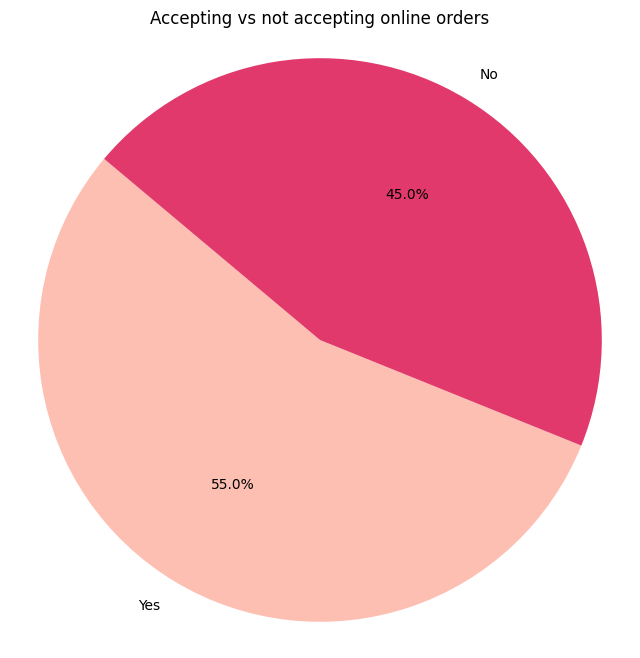

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use the DataFrame 'df' loaded from the CSV file
x = df['online_order'].value_counts()

# Define labels and colors for the pie chart
labels = x.index
sizes = x.values
colors = ['#FEBFB3', '#E1396C']

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Accepting vs not accepting online orders')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


Text(0.5, 0, 'Number of outlets')

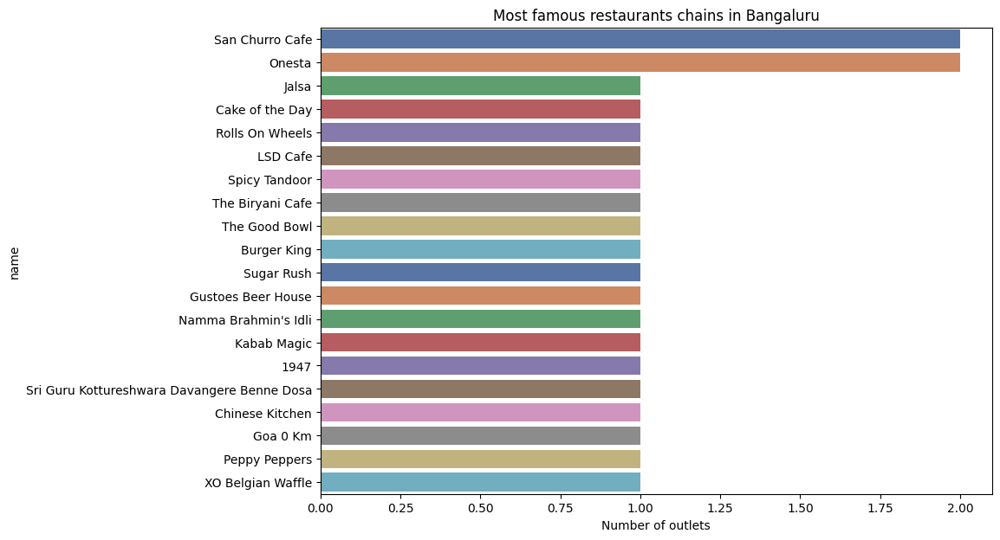

In [ ]:
# Which are the top restaurant chains in Bangaluru?
plt.figure(figsize=(10,7))
chains=df['name'].value_counts()[:20]
sns.barplot(x=chains,y=chains.index,palette='deep')
plt.title("Most famous restaurants chains in Bangaluru")
plt.xlabel("Number of outlets")

In [ ]:
# What is the ratio b/w restaurants that provide and do not provide table booking ?
import plotly.graph_objs as go
from plotly.offline import iplot

# Use the DataFrame 'df' loaded from the CSV file
x = df['book_table'].value_counts()

colors = ['#96D38C', '#D0F9B1']

trace = go.Pie(
    labels=x.index,
    values=x,
    textinfo="value",
    marker=dict(colors=colors, line=dict(color='#000000', width=2))
)

layout = go.Layout(
    title="Table booking",
    width=500,
    height=500
)

fig = go.Figure(data=[trace], layout=layout)
iplot(fig, filename='pie_chart_subplots')


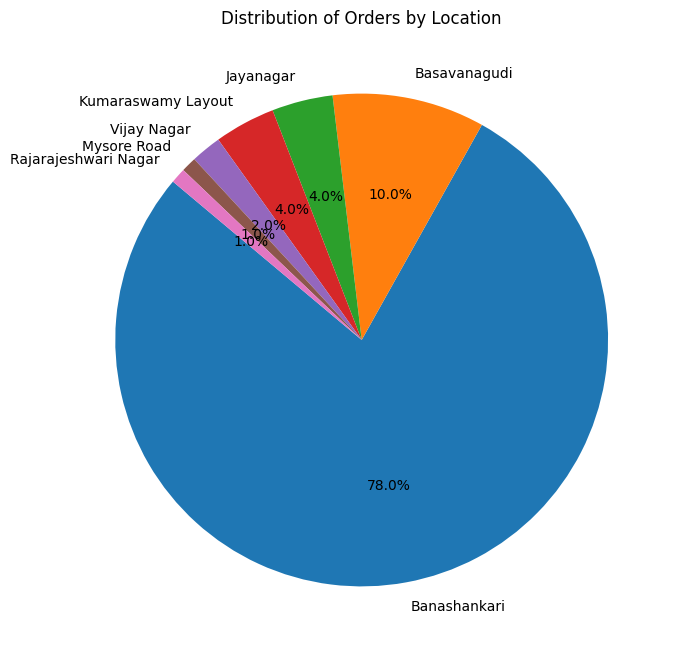

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with restaurant data

# Calculate the count of orders for each location
orders_by_location = df['location'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(10, 8))
orders_by_location.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Orders by Location')
plt.ylabel('')  # Remove the y-label
plt.show()


In [ ]:
# Assuming 'df' is your DataFrame containing order information

# Group the data by location and menu item
orders_by_location_item = df.groupby(['location', 'menu_item']).size().reset_index(name='count')

# Find the most ordered item in each location
most_ordered_items = orders_by_location_item.groupby('location').apply(lambda x: x.loc[x['count'].idxmax()])

# Print the most ordered item from each location
print(most_ordered_items[['location', 'menu_item', 'count']])


                                  location  \
location                                     
Banashankari                  Banashankari   
Basavanagudi                  Basavanagudi   
Jayanagar                        Jayanagar   
Kumaraswamy Layout      Kumaraswamy Layout   
Mysore Road                    Mysore Road   
Rajarajeshwari Nagar  Rajarajeshwari Nagar   
Vijay Nagar                    Vijay Nagar   

                                                              menu_item  count  
location                                                                        
Banashankari                                                         []     74  
Basavanagudi                                                         []      9  
Jayanagar                                                            []      3  
Kumaraswamy Layout    ['3 Poori with Subji', 'Chole Bhature [2 Piece...      1  
Mysore Road                                                          []      1  
Rajarajeshwari Nag

# Network/ Structure based

https://snap.stanford.edu/data/ego-Facebook.html


In [ ]:

import csv

# Open the text file for reading
with open('data.txt', 'r') as txt_file:
    lines = txt_file.readlines()

# Define the output CSV file name
csv_filename = 'output.csv'

# Open the CSV file for writing
with open(csv_filename, 'w', newline='') as csv_file:
    writer = csv.writer(csv_file)

    # Write header row if needed
    writer.writerow(['start_node', 'end_node'])

    # Write data to CSV file
    for line in lines:
        # Split the line into start and end nodes
        start_node, end_node = map(int, line.split())
        writer.writerow([start_node, end_node])

print(f"CSV file '{csv_filename}' has been created successfully.")


CSV file 'output.csv' has been created successfully.


[(107, 0.45969945355191255),
 (58, 0.3974018305284913),
 (428, 0.3948371956585509),
 (563, 0.3939127889961955),
 (1684, 0.39360561458231796),
 (171, 0.37049270575282134),
 (348, 0.36991572004397216),
 (483, 0.3698479575013739)]

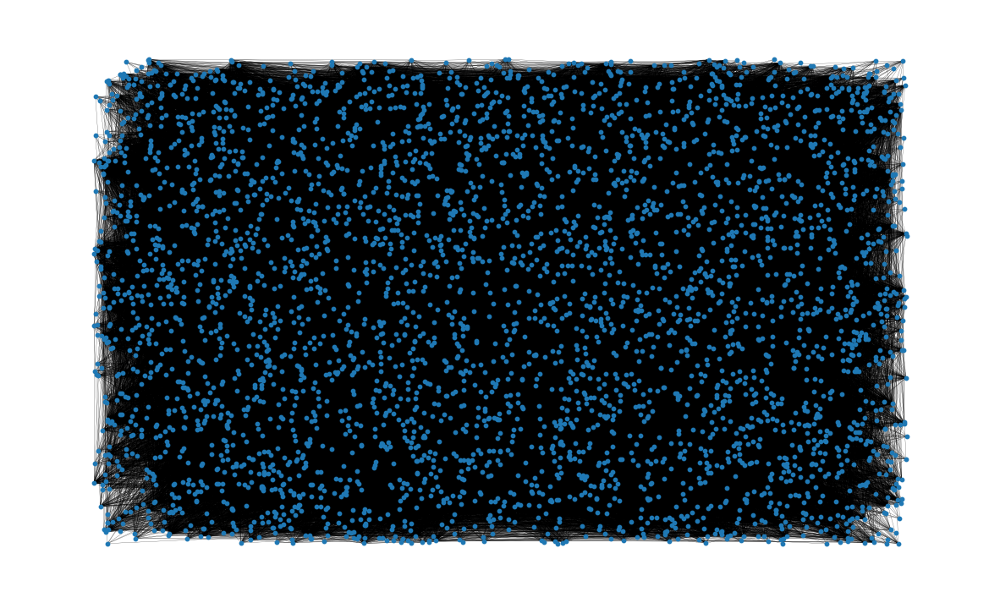

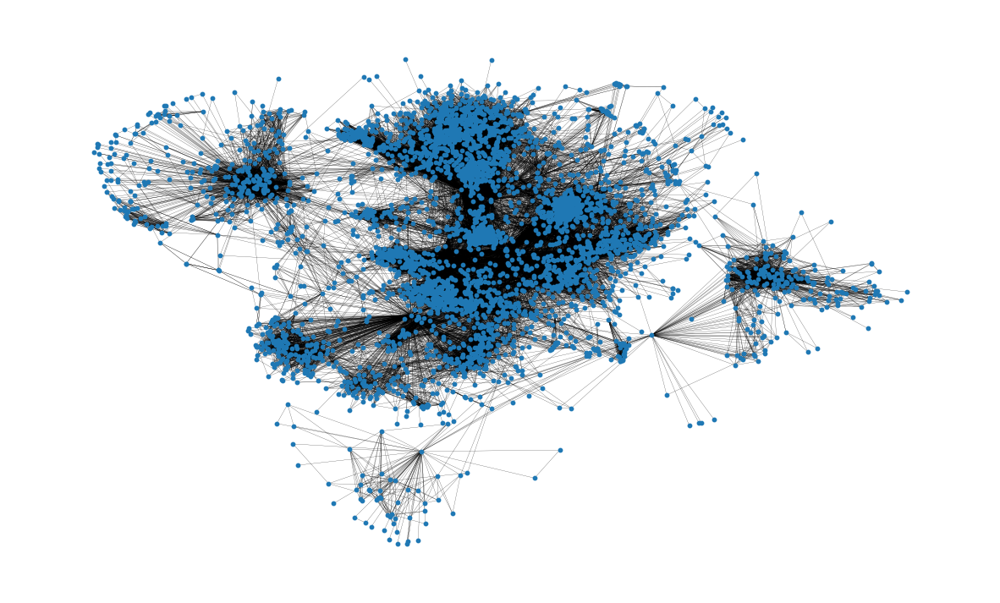

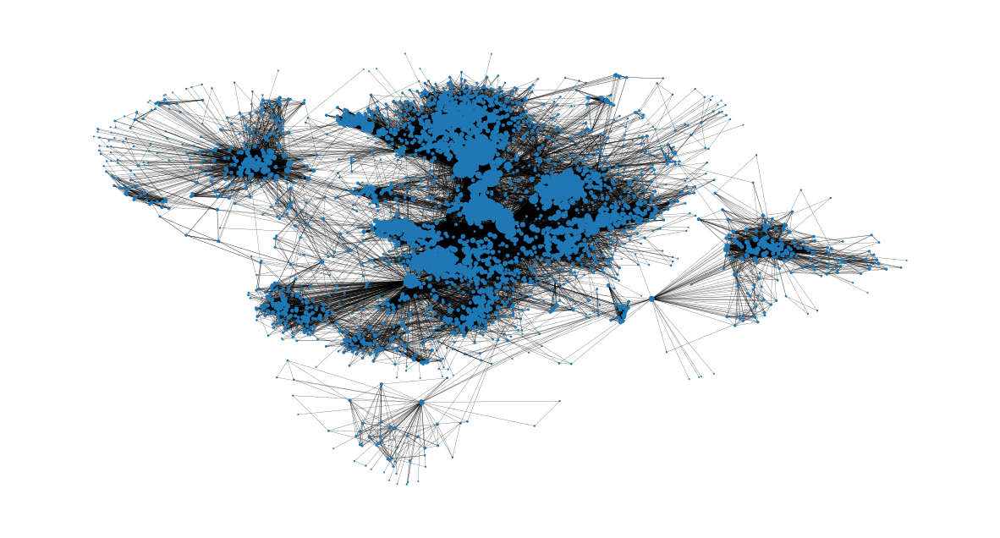

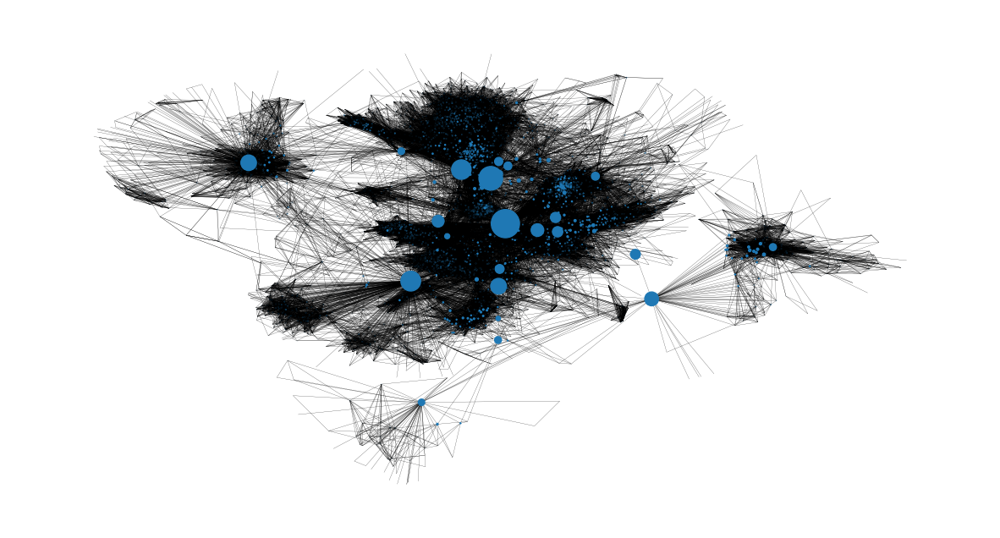

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from random import randint

%matplotlib inline

facebook = pd.read_csv("output.csv")

G = nx.from_pandas_edgelist(facebook, "start_node", "end_node")

fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")
plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

pos = nx.spring_layout(G, iterations=15, seed=1721)
fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")
nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)


G.number_of_nodes()
G.number_of_edges()
np.mean([d for _, d in G.degree()])

shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))
shortest_path_lengths[0][42]

degree_centrality = nx.centrality.degree_centrality(
    G
)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:8]


(sorted(G.degree, key=lambda item: item[1], reverse=True))[:8]

node_size = [
    v * 1000 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

betweenness_centrality = nx.centrality.betweenness_centrality(
    G
)  # save results in a variable to use again
(sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]
node_size = [
    v * 1200 for v in betweenness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

closeness_centrality = nx.centrality.closeness_centrality(
    G
)  # save results in a variable to use again
(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]


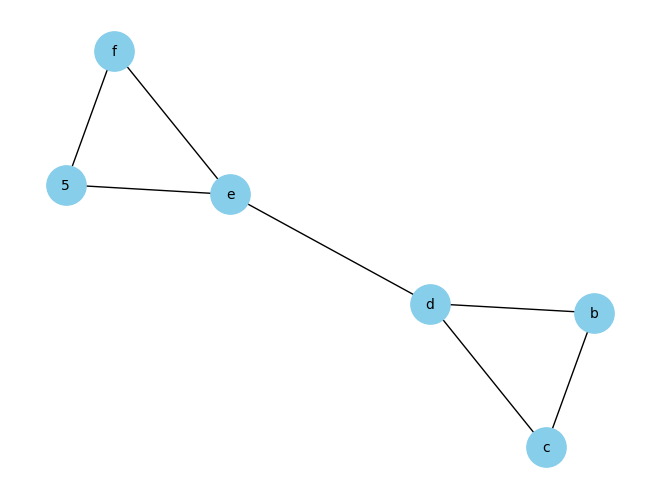

Degree Centrality:
Node b: 0.4
Node c: 0.4
Node d: 0.6000000000000001
Node e: 0.6000000000000001
Node f: 0.4
Node 5: 0.4

Betweenness Centrality:
Node b: 0.0
Node c: 0.0
Node d: 0.6000000000000001
Node e: 0.6000000000000001
Node f: 0.0
Node 5: 0.0

Closeness Centrality:
Node b: 0.5
Node c: 0.5
Node d: 0.7142857142857143
Node e: 0.7142857142857143
Node f: 0.5
Node 5: 0.5


In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Function to plot the graph
def plot_graph(adjacency_matrix, labels):
    G = nx.from_numpy_array(adjacency_matrix)
    node_mapping = {i: label for i, label in enumerate(labels)}
    G = nx.relabel_nodes(G, node_mapping)
    nx.draw(G, with_labels=True, node_color='skyblue', node_size=800, font_size=10)
    plt.show()

# Function to calculate and print centralities
def calculate_and_print_centralities(adjacency_matrix, labels):
    G = nx.from_numpy_array(adjacency_matrix)
    node_mapping = {i: label for i, label in enumerate(labels)}
    G = nx.relabel_nodes(G, node_mapping)

    # Degree Centrality
    degree_centralities = nx.degree_centrality(G)
    print("Degree Centrality:")
    for node, centrality in degree_centralities.items():
        print(f"Node {node}: {centrality}")

    # Betweenness Centrality
    betweenness_centralities = nx.betweenness_centrality(G)
    print("\nBetweenness Centrality:")
    for node, centrality in betweenness_centralities.items():
        print(f"Node {node}: {centrality}")

    # Closeness Centrality
    closeness_centralities = nx.closeness_centrality(G)
    print("\nCloseness Centrality:")
    for node, centrality in closeness_centralities.items():
        print(f"Node {node}: {centrality}")

# Main code
adjacency_matrix_text = """
  a b c d e f
a 0 1 1 0 0 0
b 1 0 1 0 0 0
c 1 1 0 1 0 0
d 0 0 1 0 1 1
e 0 0 0 1 0 1
f 0 0 0 1 1 0
"""

# Parse the node labels and adjacency matrix
lines = adjacency_matrix_text.strip().split('\n')
labels = lines[0].split()[1:]
adjacency_matrix = np.array([[int(cell) for cell in row.split()[1:]] for row in lines[1:]])

plot_graph(adjacency_matrix, labels)
calculate_and_print_centralities(adjacency_matrix, labels)


#data cleaning


https://www.classcentral.com/tag/electronics

In [ ]:
import pandas as pd

# Read the data from the CSV file into a pandas DataFrame
# Assuming comma as delimiter
df = pd.read_csv("scraper.csv", delimiter=',', na_values=[''], encoding='latin-1')


In [ ]:
import pandas as pd

# Read the data from the CSV file into a pandas DataFrame
# Assuming comma as delimiter
df = pd.read_csv("scraper.csv", delimiter=',', na_values=[''], encoding='latin-1')

# Debugging: Print out column names
print(df.columns)

# Check for missing values
print(df.isnull().sum())

# Convert 'number-of-reviews' to numeric
df['number-of-reviews'] = pd.to_numeric(df['number-of-reviews'], errors='coerce')

# Remove duplicates
df.drop_duplicates(inplace=True)



Index(['Course URL', 'Course Image URL src', 'margin-right-xsmall href',
       'University URL', 'course-name', 'number-of-reviews', 'descp',
       'CA-available-at', 'Link-to-course', 'duration', 'cost', 'properties',
       'offered-by'],
      dtype='object')
Course URL                   0
Course Image URL src         0
margin-right-xsmall href     3
University URL               5
course-name                  0
number-of-reviews            3
descp                        0
CA-available-at              0
Link-to-course               0
duration                     0
cost                         0
properties                   0
offered-by                  11
dtype: int64
